## End_to_end Multi_class Dog Breed Classification

This notebook built an end_to_end multi_class image classifier using TesorFlow 2.12 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggel's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed for each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some informaation about the data:
* We're dealing with images (unstructured data) so it's
probably best we use deep learning/ transfer learning.

* There are 120 breeds of dogs (this means there are 120 different classes).

* There are around 10,000+ images in the training set (these images have lables).

* There are around 10,000+ images in the test set (these images have no lables, because we'll want to predict them).

## Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# !unzip 'drive/MyDrive/Dog Vision/dog-breed-identification.zip' -d 'drive/MyDrive/Dog Vision/'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF Version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for GPU availability
print('GPU','available (yesss!!!!!)' if tf.config.list_physical_devices('GPU') else 'not available')

TF Version: 2.13.0
TF Hub version: 0.15.0
GPU available (yesss!!!!!)


## Getting our data ready (turning into Tensors)

with all machine learning models our data has to be in numerical format . so that's what we'll be doing first. turning our images into Tensors (numerical representation)

Let's start by accessing our data and checking out the labels

In [ ]:
# checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

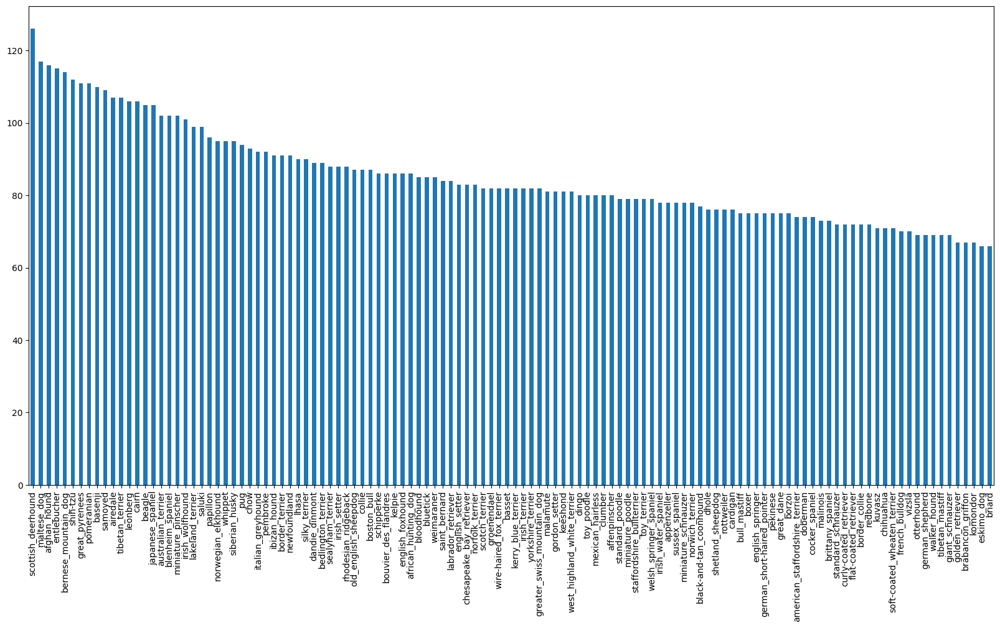

In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

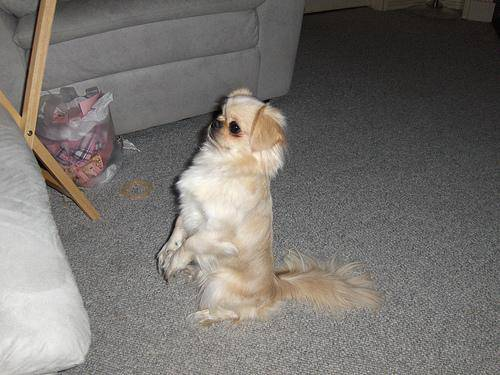

In [ ]:

# Let's view an image
from IPython.display import Image
Image('drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg')

### Getting images and their lables

Let's get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathname from image ID's
filename = ['drive/MyDrive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filename[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir('drive/MyDrive/Dog Vision/train/')[:10]

['35cc113cc5807a081a22317ddc0e6861.jpg',
 '35de6afba5628a315910380be1f74c57.jpg',
 '35d6d29d3db9cb7636ac49f960c3a0c7.jpg',
 '35e3f1032d5ae454fc835538f58ba6fd.jpg',
 '35e495b1de348a81e9c64f929de8beff.jpg',
 '35f3b4e4d718f399667ecc02226cc502.jpg',
 '35f63ed3f8103464956787f28cd8e74a.jpg',
 '35fbb975be078989d1c17d66ba16b6cb.jpg',
 '360402a4c41e0979e1f6d8b401e676a4.jpg',
 '360bda660c0771a91f106602d35cdd8e.jpg']

In [ ]:
len(filename)

10222

In [ ]:
len(os.listdir('drive/MyDrive/Dog Vision/train/'))

10222

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog Vision/train/')) == len(filename):
  print('Filenames match actual amount of files!!! Proceed.')
else:
    print('Filenames do not match actual amount of files, check the target directory.')

Filenames match actual amount of files!!! Proceed.


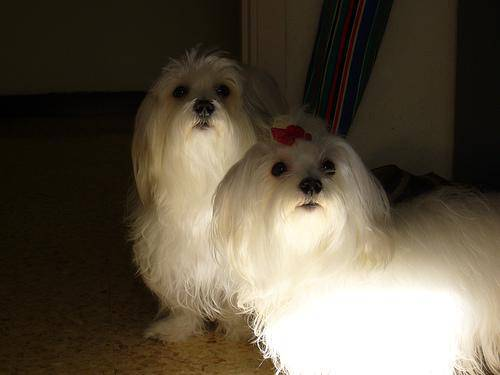

In [ ]:
# One more check
Image(filename[10200])

In [ ]:
labels_csv['breed'][10200]

'maltese_dog'

Since we've now got our training images filepaths in a list, let's prepare our lables

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) # dose same thing as above
labels


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# see if number of labels matches the number of filenames
if len(labels) == len(filename):
  print('Number of labels matches number of filename!!')
else:
  print('Number of labels does not match number of filename, check data directories!')

Number of labels matches number of filename!!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
len(boolean_labels)

10222

In [ ]:
len(filename)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
since the dataset from Kaggel does'nt come with a validation set, we 're going to create our own.

In [ ]:
# Setup X & y variables
X = filename
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

### Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a  few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert colour channel values from 0-255 to 0-1
5. Resize the `image` to be a shape of(224,224)
6. Return the modified `image`


Before we do, let's see what importing image looks like.

In [ ]:
# Convert image to numPy array
from matplotlib.pyplot import imread
image = imread(filename[0])
image.shape

(375, 500, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:1]

array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]]], dtype=uint8)

In [ ]:
# Turn image into Tensor
tf.constant(image)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]],

       [[151,  98,  56],
        [188, 137,  94],
        [162, 113,  70],
        ...,
        [200, 168,  81],
        [196, 162,  75],
        [200, 168,  81]],

       ...,

       [[189, 122,  69],
        [186, 119,  66],
        [183, 116,  63],
        ...,
        [213, 160, 106],
        [212, 159, 107],
        [209, 156, 102]],

       [[186, 119,  66],
        [184, 117,  64],
        [183, 116,  63],
        ...,
        [197, 145,  88],
        [199, 146,  92],
        [199, 147,  90]],

       [[182, 115,  62],
        [181, 114,  61],
        [183, 116,  63],
        ...,
        [184, 132,  7

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Trnsor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desire value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


### Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32(this is the batch size) images at a time (you can manually adjust the batch size if need be ).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the assosciated label,
  processes the image and return a typle of (image, label)
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples pf Tensors in the form: `(image, label)`, let's make a function to turn all of our data(`x` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # If the data is a test dataset, we probably don't have lables
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepath (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If a data is a valid dataset, we dont't need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #  filepath
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
      print('Creating training data batches...')
      # Turn filepath and labels into Tensors
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                 tf.constant(y)))
      # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
      data = data.shuffle(buffer_size = len(X))

      # Create (image, label) tuples (this also turns the image path into a preprocessed image)
      data = data.map(get_image_label)

      # Turn the training data into batches
      data_batch = data.batch(BATCH_SIZE)
  return data_batch



In [ ]:
# Creare training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however these can be a little hard to understand/comprehend, let's visualize them

In [ ]:

import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 image and their labels from a dat batch.
  '''

  # Setup the figure
  plt.figure(figsize=(20, 20))
  # Loop through 25 (for display 25 images)
  for i in range(25):
    # Create subplot (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Trun the grid lines off
    plt.axis('off')

In [ ]:

train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# train_images, train_labels = next(train_data.as_numpy_iterator())
# len(train_images), len(train_labels)

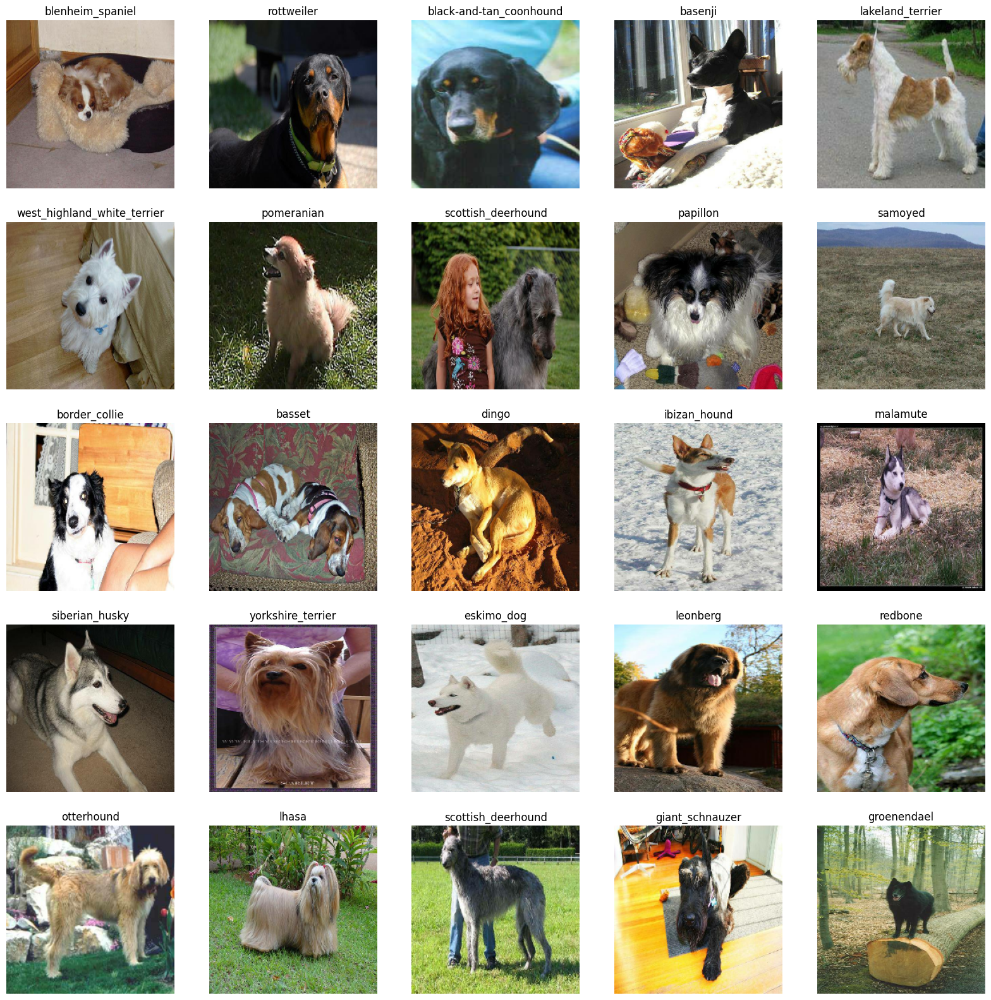

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

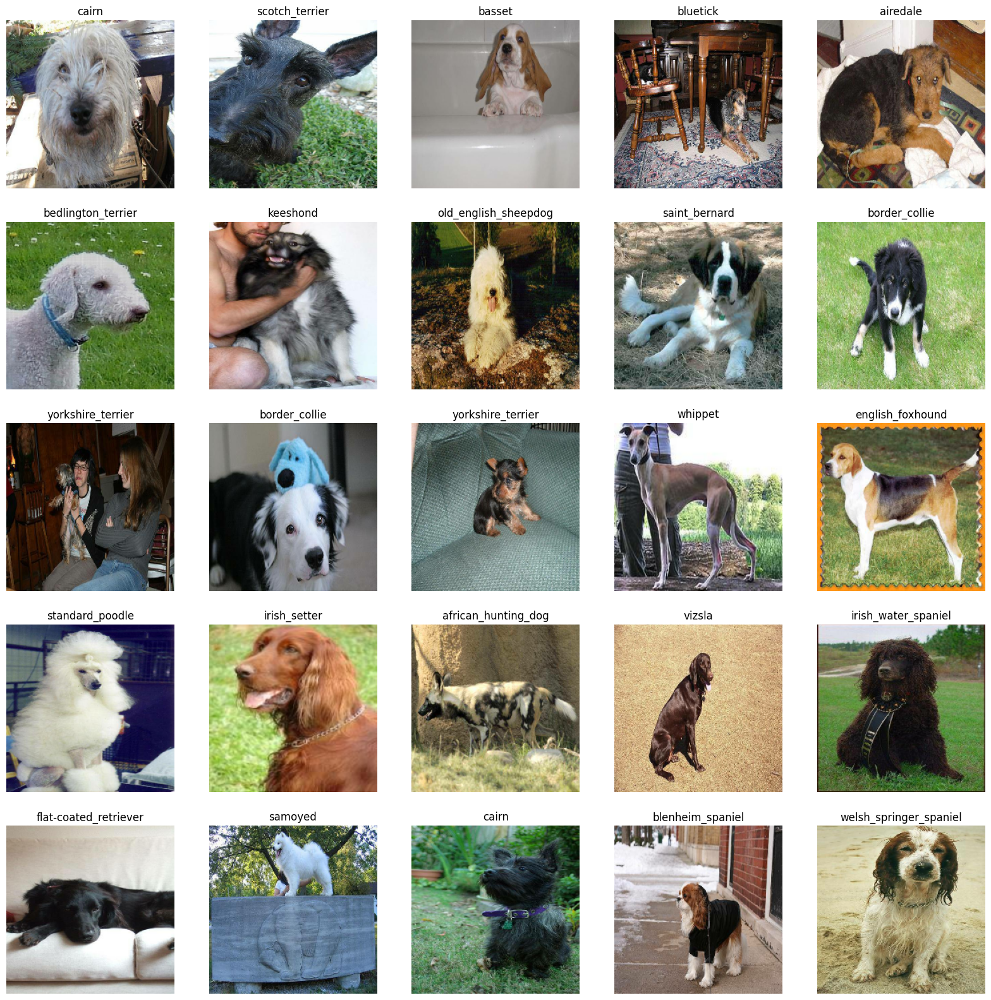

In [ ]:
# Now let's visualize the data in a visualization batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

Before we built a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* Thr URL of the model we want to use from TrnsorFlow Hub:
https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5

In [ ]:
IMG_SIZE

224

In [ ]:
# Setuop input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5'

Now we've got our inputs, outputs ans model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameter
*  Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Built the model (tells the model the input shape it'll be getting).
* Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builts Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # Built the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              55875273  
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 55995513 (213.61 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 55875273 (213.15 MB)
_________________________________________________________________


##  Create callbacks

Callbacks are helper function a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

* We'll create two callbacks,
* One for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to built a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Dog Vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 80 #@param {type:'slider',  min:10, max:100, step:10}


In [ ]:
# Check to make sure we're still runing on a GPU
print('GPU', 'available yessss!!!!!' )if tf.config.list_physical_devices('GPU') else 'not available'

GPU available yessss!!!!!


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Built a function to train and return a training model
def train_model():
  '''
  Trains a given model and return the trained version.
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytimes we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # return the fitted model
  return model

In [ ]:
def save_model(model, suffix=None):
  '''
  Save a given model in a models directory and appends a suffix (string).
  '''
  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix +'.h5'
  print(f'Saving model to: {model_path}....')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer': hub.KerasLayer})
  return model

In [ ]:
loaded_4000_images_trained_model = load_model('drive/MyDrive/Dog Vision/models/20230330-081502-working-4000-images-resnet-v2.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20230330-081502-working-4000-images-resnet-v2.h5


In [ ]:
# Fit the model to the data
model = loaded_4000_images_trained_model

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we creates earlier and visualize its content

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 118s 18s/step


array([[1.3220100e-06, 1.0431359e-05, 2.4990415e-08, ..., 6.7819696e-05,
        4.0425816e-06, 1.1427821e-05],
       [5.1035855e-05, 2.5083204e-05, 5.9006078e-07, ..., 3.9664460e-06,
        2.2150812e-06, 1.6823290e-07],
       [5.2858663e-06, 1.3002790e-05, 9.4971762e-07, ..., 2.6609428e-07,
        1.7501579e-08, 1.3380237e-07],
       ...,
       [7.4810077e-07, 4.2537135e-07, 1.4681434e-08, ..., 5.6023080e-08,
        1.3117281e-07, 2.0499680e-09],
       [3.8298772e-08, 1.5753230e-08, 6.3234872e-08, ..., 8.1084991e-08,
        1.9219935e-07, 9.1811052e-07],
       [5.7659986e-07, 2.2321252e-07, 1.4729007e-06, ..., 5.2270811e-05,
        1.9821493e-05, 2.7490905e-05]], dtype=float32)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
# np.savetxt('drive/MyDrive/Dog Vision/preds_array_4000.csv', predictions, delimiter=',')

In [ ]:
# Load predictions (NumPy array) from csv file
# predictions = np.loadtxt('drive/MyDrive/Dog Vision/preds_array_4000.csv', delimiter=',')

In [ ]:
np.sum(predictions[0])

0.99999976

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[1.3220100e-06 1.0431359e-05 2.4990415e-08 3.2638516e-07 4.2329844e-05
 3.2591879e-06 4.5219361e-04 7.7789288e-08 5.6880722e-06 1.3172742e-06
 4.1538752e-07 6.3031024e-08 2.9038449e-06 5.7171018e-08 4.6870487e-06
 1.6529903e-04 5.6678340e-07 1.2859470e-03 2.0918193e-07 3.8243434e-07
 6.7472711e-06 2.3431156e-07 1.0085041e-06 7.6643355e-06 5.5643627e-06
 9.8367855e-07 9.3273622e-01 4.6741198e-07 9.5180854e-07 3.5762146e-06
 1.0349368e-08 1.2728096e-04 2.8674424e-06 3.8291790e-07 8.0678477e-09
 1.9409982e-02 6.2884283e-08 5.0120684e-07 1.3497740e-07 1.6380882e-06
 1.7128774e-05 1.0376863e-04 5.8571015e-08 1.5600975e-06 9.4001074e-08
 4.6385767e-07 1.1083388e-07 9.9578801e-06 7.1034892e-06 1.1401989e-05
 3.6276884e-08 5.7715300e-07 1.2477763e-05 6.6030758e-08 5.0414961e-08
 3.2850616e-07 2.4124316e-07 6.6806045e-08 7.3127001e-07 8.2773236e-05
 9.2147424e-08 6.0726660e-07 2.8631510e-07 3.8500339e-06 3.5738674e-07
 1.1236930e-06 1.0594861e-07 4.3655609e-06 3.1695912e-05 8.5354286e-06
 3.338

In [ ]:
unique_breeds[26]

'cairn'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probalilities are also known as confidence level

In [ ]:
# Turn probalilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turn an array of prediction probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[26])
pred_label

'komondor'

Mow since our validation data is still in a batch dataset, we'll have to unbatchify it to make preditions on the validation images and then comapre those predictions to the validation labels.

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch the dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images an labels.
  '''
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[25])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for images, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[108,  46,   0],
         [152,  92,  42],
         [180, 120,  70],
         ...,
         [176, 144,  69],
         [189, 157,  82],
         [214, 182, 107]],
 
        [[151,  93,  47],
         [179, 121,  75],
         [167, 111,  64],
         ...,
         [167, 136,  56],
         [172, 139,  60],
         [188, 157,  77]],
 
        [[151,  98,  56],
         [188, 137,  94],
         [162, 113,  70],
         ...,
         [200, 168,  81],
         [196, 162,  75],
         [200, 168,  81]],
 
        ...,
 
        [[189, 122,  69],
         [186, 119,  66],
         [183, 116,  63],
         ...,
         [213, 160, 106],
         [212, 159, 107],
         [209, 156, 102]],
 
        [[186, 119,  66],
         [184, 117,  64],
         [183, 116,  63],
         ...,
         [197, 145,  88],
         [199, 146,  92],
         [199, 147,  90]],
 
        [[182, 115,  62],
         [181, 114,  61],
         [183, 116,  63],
         ...,
         [184, 132,  74],
  

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more vizualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and array of images and integers
* Convert the prediction probabilities to a predicted label.
* Plot the pridicted label. its predicted probability, the truth label and the target image on a single plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)* 100,
                                    true_label),
                                    color=color)

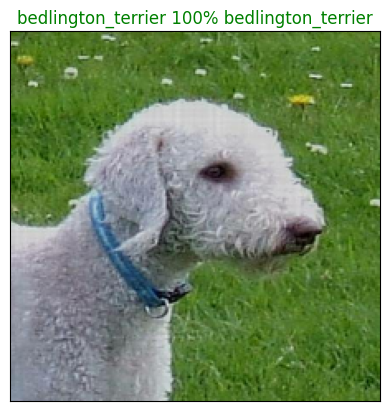

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n=5)


Now we've got function to vizualize our models top predictions. let's make another to view our model top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction usinf `get_pred_label()`.
* Find the top 10:
    * Prediction probabilities indexes.
    * Prediction probabilities values.
    * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plus the top 10 highest prediction confidence along with the truth label for samplr n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'gray')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 26, 109,  35,  76, 103,  79,  17,   6,  73,  15])

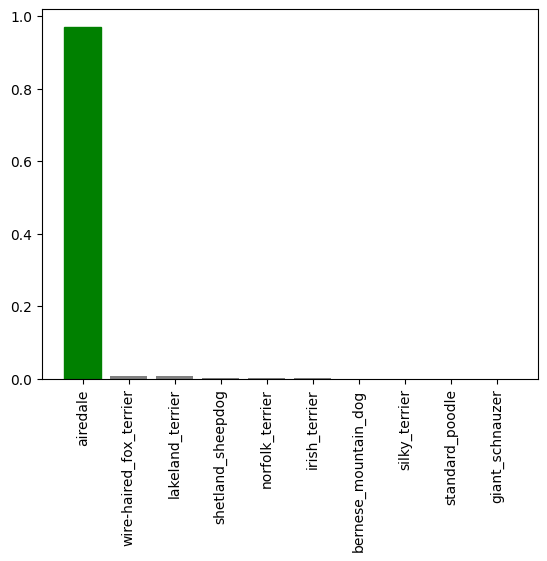

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=4)

Now we've got some function to help us vizualize our predictions and evaluate our model, let's check out a few

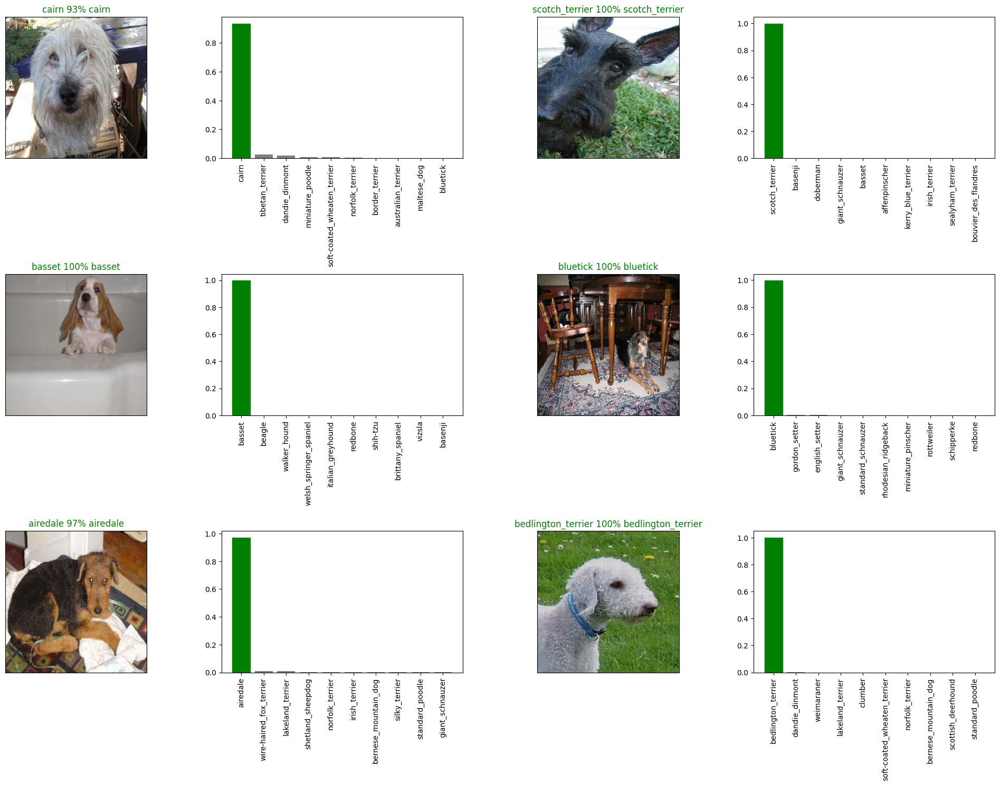

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Training a bid dog model ( on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
# Create a data batch with the full data
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validtation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)


In [ ]:
# Fit the full model to the full data
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
# save_model(full_model, suffix='final-model-resnet-v2')

In [ ]:
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20230331-16091680278967-final-model-resnet-v2.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20230331-16091680278967-final-model-resnet-v2.h5


In [ ]:
# Load test image filename
test_path = 'drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]


In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the load full model
# test_predictions = loaded_full_model.predict(test_data,
#                                              verbose=1)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
# np.savetxt('drive/MyDrive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog Vision/preds_array.csv', delimiter=',')

In [ ]:
test_predictions[:10]

array([[5.14686898e-17, 2.82456248e-14, 1.78929312e-24, ...,
        2.41850112e-23, 3.35074680e-14, 5.34159449e-18],
       [3.26921975e-13, 9.82998676e-15, 2.05820495e-13, ...,
        1.34385165e-13, 4.26903790e-11, 4.61220309e-13],
       [1.32740710e-14, 1.00826575e-14, 6.73575501e-11, ...,
        3.98198955e-15, 3.88817240e-16, 9.69300269e-13],
       ...,
       [3.16425780e-15, 1.06812964e-14, 7.24620932e-15, ...,
        6.03016308e-15, 1.01730872e-11, 2.67001861e-13],
       [2.46084975e-14, 5.41611366e-14, 9.86995138e-11, ...,
        8.63713794e-05, 1.49675261e-09, 1.92801597e-15],
       [2.78614177e-16, 1.18882624e-14, 6.94309880e-22, ...,
        8.71516170e-18, 4.02809579e-18, 4.15549923e-19]])

## Making predictions on our own Images

To make prediction on our own images, we'll:
 * Get the filepath of our own images.
 * Turn the file path into data batches using `create_data_batches()`. And since our own images not have labels, we set the `test_data` parameter to True.
 * Pass the coustom image data batch to our own model's Predictions labels.
 * Convert the prediction output probabilities to predictions labels.
 * Compare the predictes labels to the custom images.

In [ ]:
# Get custom Image filepath
custom_path = 'drive/MyDrive/Dog Vision/Dog Images/'
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_path

['drive/MyDrive/Dog Vision/Dog Images/lhasa apso.jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/Dog1.jpg',
 'drive/MyDrive/Dog Vision/Dog Images/dog2.jpg',
 'drive/MyDrive/Dog Vision/Dog Images/images (2).jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/download (6).jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/download (7).jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/images (4).jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/images (5).jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/tibtian.jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/download (1).jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/download (2).jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/download (3).jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/images (1).jpeg',
 'drive/MyDrive/Dog Vision/Dog Images/images (3).jpeg']

In [ ]:
custom_data = create_data_batches(custom_image_path, test_data=True)


Creating test data batches...


In [ ]:
len(custom_image_path)

14

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 3s 3s/step


In [ ]:
len(custom_preds)

14

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['lhasa',
 'labrador_retriever',
 'siberian_husky',
 'rottweiler',
 'german_shepherd',
 'pug',
 'american_staffordshire_terrier',
 'boxer',
 'tibetan_mastiff',
 'golden_retriever',
 'french_bulldog',
 'standard_poodle',
 'vizsla',
 'vizsla']

In [ ]:
custom_images = []
# Loop through umbatch data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

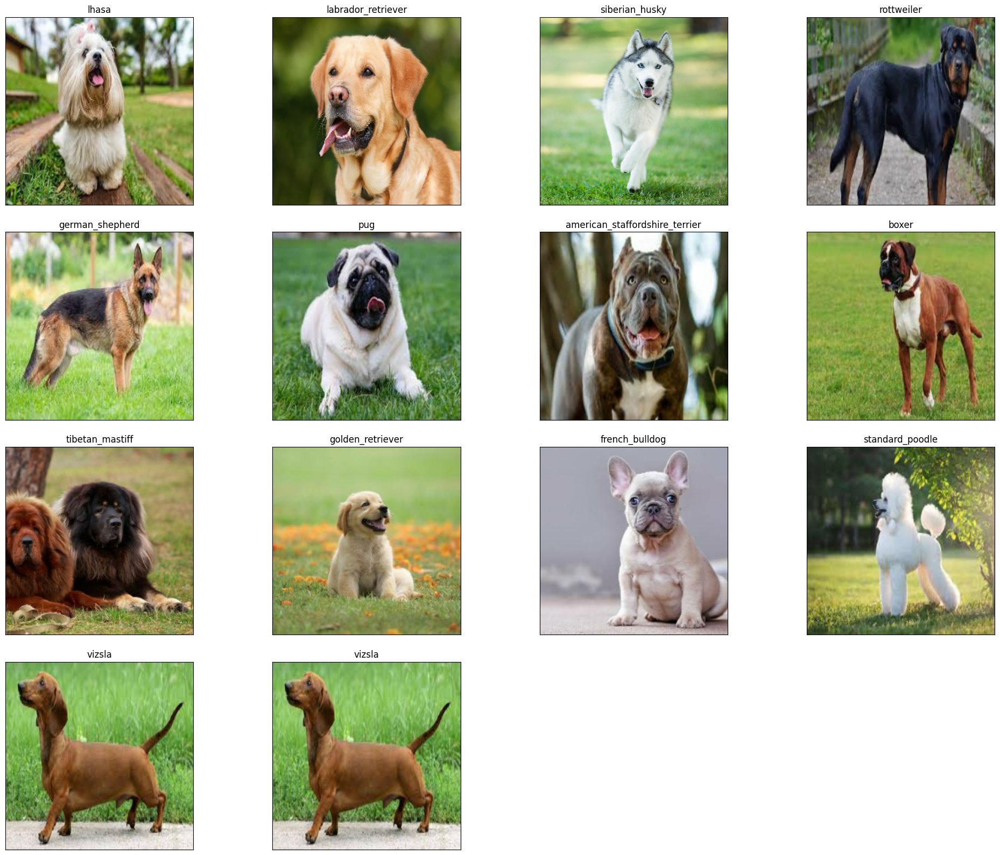

In [ ]:
# Check custom image predictions
plt.figure(figsize=(20, 20))
for i, image in enumerate(custom_images):
  plt.subplot(5,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.tight_layout(h_pad=2.0)
  plt.imshow(image)